# 验证meta-grating优化之后的结果

In [8]:
import math
import os

import meep.adjoint as mpa
import numpy as np
from autograd import grad
from autograd import numpy as npa
from autograd import tensor_jacobian_product
from matplotlib import pyplot as plt
from matplotlib.patches import Circle
from scipy import signal, special

import meep as mp
import nlopt  # need install nlopt
plt.style.use("seaborn")

%matplotlib inline
%config InlineBackend.figure_format = 'svg'
np.random.seed(0)

os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
cur_path = os.getcwd()
idea_path = cur_path + '/idea/'

/tmp/ipykernel_6763/1986911542.py:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


In [9]:
opt_path = cur_path + "/opt_1/"

8.373640724839385e-06


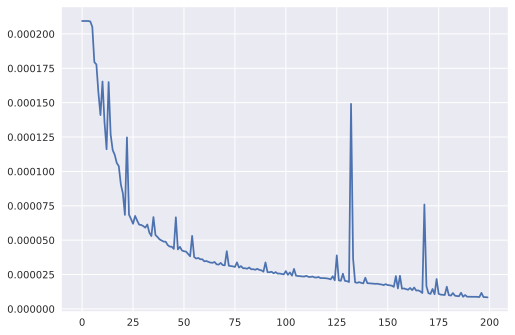

In [10]:
evaluation_history = np.load(opt_path + "eval_history.npy")
plt.plot(evaluation_history)
print(evaluation_history[-1])

**eps_file**

In [11]:
# init_file
evaluation_histary_files = []
epses = []
eps_files = []
eps_file = opt_path + "final_eps.npy"
eps = np.load(eps_file)
epses.append(eps)
# wg_gap数量与eps数量相同
wg_gap = []
wg_gap.append(0)
wg_gap.append(0)
# total_eps = np.concatenate(epses, axis=0)

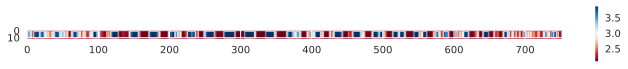

In [12]:
# plot the eps to verify
plt.figure(figsize=(12, 1))
plt.imshow(np.rot90(np.abs(epses[0])), cmap='RdBu')
plt.colorbar()

**Basic Setup**

     block, center = (0,-1.85,0)
          size (27.04,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.9025,11.9025,11.9025)
     block, center = (0,-0.6,0)
          size (27.04,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (0,0.75,0)
          size (27.04,0.7,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (-11.02,0.5,0)
          size (7,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.8416,3.8416)
     block, center = (11.02,0.5,0)
          size (7,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.8416,3.8416)
     block, center = (8.88178e-16,0.5,0)
          size (15.04,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
     block, center

time for set_epsilon = 1.23224 s
-----------


MPB solved for frequency_1(1,0,0) = 0.607781 after 8 iters
MPB solved for frequency_1(2.12376,0,0) = 1.2419 after 8 iters
MPB solved for frequency_1(2.1834,0,0) = 1.27381 after 6 iters
MPB solved for frequency_1(2.18354,0,0) = 1.27389 after 3 iters
MPB solved for frequency_1(2.18354,0,0) = 1.27389 after 1 iters
     block, center = (0,-1.85,0)
          size (27.04,0.5,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (11.9025,11.9025,11.9025)
     block, center = (0,-0.6,0)
          size (27.04,2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (0,0.75,0)
          size (27.04,0.7,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (2.0736,2.0736,2.0736)
     block, center = (-11.02,0.5,0)
          size (7,0.2,0)
          axes (1,0,0), (0,1,0), (0,0,1)
          dielectric constant epsilon diagonal = (3.8416,3.84

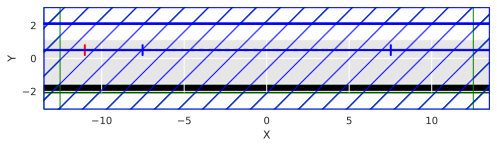

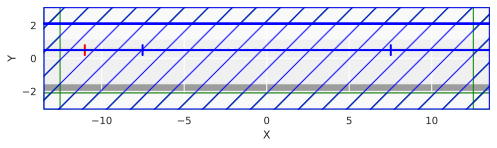

In [13]:
# if True compute flux (Gaussian source), if False compute DFT (Continue source)
compute_flux = True
# size of input and output waveguide
w = 0.5
h = 0.2

# resolution size
grid = 0.02
resolution = 1 / grid
design_res = resolution

# thickness of PML
dpml = 1

##################### length parameter ################
input_wvg_length = 5
output_wvg_length = 5
# design_region
design_region_x = np.zeros(len(epses))
for ii in range(0, len(epses)):
    design_region_x[ii] = len(epses[ii]) * (1 / design_res)
design_region_y = 0.2
sx = (
    input_wvg_length
    + np.sum(design_region_x)
    + np.sum(wg_gap)
    + output_wvg_length
    + 2 * dpml
)

##################### height parameter ################
Substrate_thickness = 0.5
BOX_thickness = 2
TOX_thickness = 0.7
near_field_height = 1
sy = BOX_thickness + TOX_thickness + Substrate_thickness + near_field_height + 2 * dpml

cell = mp.Vector3(sx, sy, 0)

# Material setting
Si = mp.Medium(index=3.45)
SiO2 = mp.Medium(index=1.44)
SiN = mp.Medium(index=1.96)

####################### geometry ##########################
Substrate_geo = mp.Block(
    material=Si,
    center=mp.Vector3(y=-0.5 * sy + 0.5 * Substrate_thickness + dpml),
    size=mp.Vector3(sx, Substrate_thickness),
)
BOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(y=-0.5 * sy + Substrate_thickness + 0.5 * BOX_thickness + dpml),
    size=mp.Vector3(sx, BOX_thickness),
)
TOX_geo = mp.Block(
    material=SiO2,
    center=mp.Vector3(
        y=-0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * TOX_thickness + dpml
    ),
    size=mp.Vector3(sx, TOX_thickness),
)
input_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        -0.5 * sx + 0.5 * input_wvg_length,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(input_wvg_length + 2 * dpml, h),
)
output_waveguide_geo = mp.Block(
    material=SiN,
    center=mp.Vector3(
        0.5 * sx - 0.5 * output_wvg_length,
        -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
    ),
    size=mp.Vector3(output_wvg_length + 2 * dpml, h),
)

geometry = [
    Substrate_geo,
    BOX_geo,
    TOX_geo,
    input_waveguide_geo,
    output_waveguide_geo,
]

####################### geometry ##########################

# ####################### design region ##########################
for ii in range(0, len(epses)):
    design_region_resolution_x = design_res
    design_region_resolution_y = 5  # 200nm resolution
    Nx = int(design_region_resolution_x * design_region_x[ii])
    Ny = int(design_region_resolution_y * design_region_y)
    design_variables = mp.MaterialGrid(
        mp.Vector3(Nx, Ny), SiO2, SiN, grid_type="U_DEFAULT"
    )
    design_region = mpa.DesignRegion(
        design_variables,
        volume=mp.Volume(
            center=mp.Vector3(
                -0.5 * sx
                + input_wvg_length
                + 0.5 * design_region_x[ii]
                + dpml
                + np.sum(design_region_x[0:ii])
                + np.sum(wg_gap[0:ii]),
                -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
                0,
            ),
            size=mp.Vector3(design_region_x[ii], design_region_y),
        ),
    )
    number_para = Nx * Ny
    # 初始化granting coupler为最终优化结果
    init_para = (np.abs(epses[ii][:, 5]) - 1.44**2) / (1.96**2 - 1.44**2)

    init_para[init_para > 1] = 1
    init_para[init_para < 0] = 0
    design_region.update_design_parameters(init_para)
    geometry.append(
        mp.Block(
            center=design_region.center,
            size=design_region.size,
            material=design_variables,
        )
    )
    wg_gap_geo = mp.Block(
        material=SiN,
        center=mp.Vector3(
            -0.5 * sx
            + input_wvg_length
            + dpml
            + np.sum(design_region_x[0 : (ii + 1)])
            + np.sum(wg_gap[0:ii])
            + 0.5 * wg_gap[ii],
            -0.5 * sy + Substrate_thickness + BOX_thickness + 0.5 * h + dpml,
            0,
        ),
        size=mp.Vector3(wg_gap[ii], h),
    )
    geometry.append(wg_gap_geo)
# ####################### design region ##########################

####################### Sources ##########################
wvl = 0.785
fcen = 1 / wvl
fwidth = 0.2 * fcen
kpoint = mp.Vector3(1, 0, 0)

# waveguide source
sources = [
    mp.EigenModeSource(
        mp.GaussianSource(frequency=fcen, fwidth=fwidth),
        center=input_waveguide_geo.center,
        size=mp.Vector3(0, 3 * h),
        eig_band=1,
        eig_parity=mp.EVEN_Y + mp.ODD_Z,
        eig_match_freq=True,
        direction=mp.NO_DIRECTION,
        eig_kpoint=kpoint,
    )
]
# set nomrlized source: amplitude is 1 -> flux is 1
sources[0].amplitude = 1 / mp.GaussianSource(fcen, fwidth=fwidth).fourier_transform(
    fcen
)

####################### Sources ##########################

sim = mp.Simulation(
    resolution=resolution,
    cell_size=cell,
    boundary_layers=[mp.PML(dpml)],
    sources=sources,
    geometry=geometry,
)

# ############### Monitor ###################
nfreq = 1

near_region = mp.FluxRegion(
    center=mp.Vector3(0, 0.5 * sy - dpml, 0),
    # center=mp.Vector3(0, 0, 0),
    size=mp.Vector3(sx, 0),
)

near_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    near_region,
)

# near2far_field
n2f_field = sim.add_near2far(
    fcen,
    0,
    1,
    near_region,
)
near_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=near_region.center, size=near_region.size
)

bias_x = 0

src_region = mp.FluxRegion(
    center=mp.Vector3(
        input_waveguide_geo.center.x + (input_wvg_length / 2 + dpml),
        input_waveguide_geo.center.y,
        0,
    ),
    size=mp.Vector3(0, 3 * h, 0),
)
src_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    src_region,
)

out_region = mp.FluxRegion(
    center=mp.Vector3(
        input_waveguide_geo.center.x
        + (input_wvg_length / 2 + dpml)
        + np.sum(design_region_x)
        + np.sum(wg_gap)
        + bias_x,
        output_waveguide_geo.center.y,
        0,
    ),
    size=mp.Vector3(0, 3 * h, 0),
)
out_field = sim.add_mode_monitor(
    fcen,
    0,
    1,
    out_region,
)
wg_region = mp.FluxRegion(
    center=mp.Vector3(0, input_waveguide_geo.center.y, 0),
    size=mp.Vector3(sx, 0),
)
wg_dft = sim.add_dft_fields(
    [mp.Ez], fcen, fwidth, nfreq, center=wg_region.center, size=wg_region.size
)
field_monitor = sim.add_dft_fields(
    [mp.Ez],
    fcen,
    fwidth,
    nfreq,
    center=mp.Vector3(),
    size=mp.Vector3(sx, sy),
)

sim.plot2D()

# mpt = mp.Vector3(input_waveguide_geo.center.x - 3, input_waveguide_geo.center.y)
mpt = mp.Vector3(output_waveguide_geo.center.x - 3, input_waveguide_geo.center.y)

f = plt.figure(dpi=100)
Animate = mp.Animate2D(fields=mp.Ez, f=f, realtime=False, normalize=True)

sim.run(
    mp.at_every(1, Animate),
    until_after_sources=mp.stop_when_fields_decayed(50, mp.Ez, mpt, 1e-5),
)

In [14]:
Animate.to_jshtml(fps=1)

## 远场验证

**优化的远场分布与目标分布的对比**

/tmp/ipykernel_6763/1106322233.py:10: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


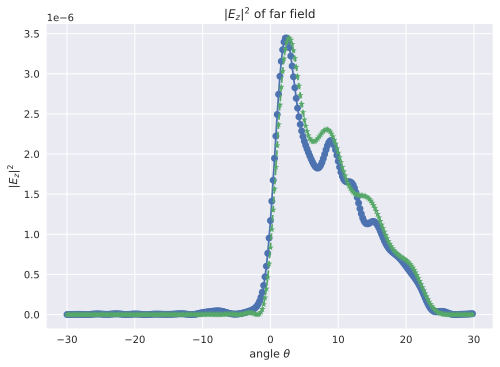

In [16]:
d_angle = 0.2
ff_distance = 1e6
ff_angle = 89
ff_number = int(2 / d_angle * ff_angle) + 1
ff_angles = np.linspace(-ff_angle, ff_angle, ff_number)
ff_points = [
    mp.Vector3(fx, ff_distance, 0) for fx in np.tan(np.radians(ff_angles)) * ff_distance
]

plt.style.use("seaborn")
n2f = []
for point in ff_points:
    ff = sim.get_farfield(n2f_field, point)
    n2f.append(ff)
rel = []  # rel中存储的是far field的强度
for ff in n2f:
    # rel.append(np.abs(ff[2]) ** 2)
    rel.append(np.abs(ff[2]) ** 2)


plot_angle = 30  # 绘制的角度范围
figure, ax = plt.subplots()
angle_minlim = np.where(ff_angles == -plot_angle)[0][0]
angle_maxlim = np.where(ff_angles == plot_angle)[0][0]
plt.plot(ff_angles[angle_minlim:angle_maxlim], rel[angle_minlim:angle_maxlim], "-o")
plt.title(r"$ |{E_z}|^2 $ of far field")
ax.set_xlabel(r"angle $ \theta $")
ax.set_ylabel(r"$ |{E_z}|^2 $")
# plt.xticks([-16, -15])

################ idea far_field ################
efficiency = 0.7  # 近场的耦合效率与inverse_design中保持一致
idea_rel = np.load(idea_path + "far_field.npy")  # idea_rel中存储的是idea far field的强度
plot_angle = 30  # 绘制的角度范围
angle_minlim = np.where(ff_angles == -plot_angle)[0][0]
angle_maxlim = np.where(ff_angles == plot_angle)[0][0]
ax.plot(
    ff_angles[angle_minlim:angle_maxlim],
    idea_rel[angle_minlim:angle_maxlim] * efficiency,
    "--*",
)

In [17]:
# 远场 flux
d_length = []
for angle in ff_angles:
    # The length of each angle in the far field
    length = ff_distance / np.cos(np.radians(angle))
    d_length.append(np.radians(d_angle) * length)

print(f"The total length {np.sum(d_length)} um calculated by angles")

energy = 0
for ii in range(0, ff_number, 1):
    energy = energy + d_length[ii] * (np.abs(rel[ii]))
print(f"The power of near_field is {energy} (calculated)")

near_field_flux = mp.get_fluxes(near_field)
print(f"The power of near_field is {near_field_flux[0]} (get from flux)")

The total length 9689347.824509013 um calculated by angles
The power of near_field is 0.6737434258492009 (calculated)
The power of near_field is 0.6715383605562869 (get from flux)


In [10]:
# # 获得不同角度范围内的误差值
# vf_obj_1 = 0
# vf_obj_2 = 0
# vf_obj_3 = 0

# for angle in range(0, np.where(ff_angles == 0)[0][0] + 1, 1):
#     vf_obj_1 += np.abs(rel[angle] - final_intensity[angle])
# for angle in range(
#     np.where(ff_angles == 0)[0][0], np.where(ff_angles == 25)[0][0] + 1, 1
# ):
#     vf_obj_2 += np.abs(rel[angle] - final_intensity[angle])
# for angle in range(np.where(ff_angles == 25)[0][0], ff_number, 1):
#     vf_obj_3 += np.abs(rel[angle] - final_intensity[angle])
# print(f"负角度：{vf_obj_1}")
# print(f"0-25角度：{vf_obj_2}")
# print(f"大角度：{vf_obj_3}")
# print(vf_obj_1 + vf_obj_2 + vf_obj_3)

负角度：4.8214873061899444e-05
0-25角度：2.4091379468783483e-06
大角度：4.214458850024892e-07
5.1045456893780286e-05


The angle of maximum intensity is 1.6635912400568953


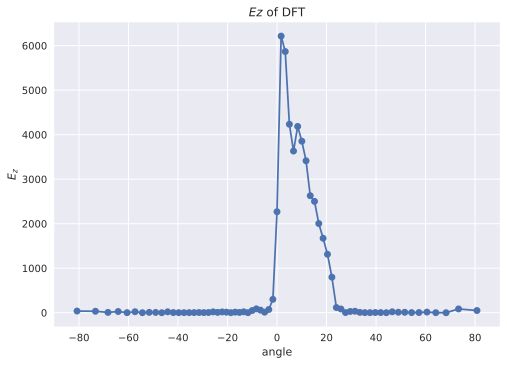

In [18]:
# fft from near field
output_dft = sim.get_dft_array(near_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=near_dft)

kx = np.fft.fftshift(np.fft.fftfreq(len(x), grid))
near_field_fft = np.fft.fftshift(np.fft.fft(output_dft))

k = 1 / wvl
kx[np.abs(kx) > k] = np.nan
angle = np.arcsin(kx / k) * 180 / np.pi

figure, ax = plt.subplots()
plt.plot(angle, np.abs(near_field_fft) ** 2, "-o")
plt.title(r"$ Ez $ of DFT")
ax.set_xlabel("angle")
ax.set_ylabel(r"$ E_z $")
ax.set_xlim(-90, 90)

max_index = np.argmax(np.abs(near_field_fft) ** 2)
print(f"The angle of maximum intensity is {angle[max_index]}")

**FFT from near dft 与 far field的结果是一致的，far field更加准确，采样点更多**

Text(0, 0.5, '$ E_z $')

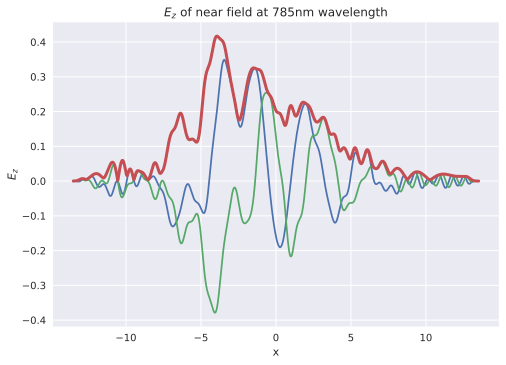

In [67]:
# near field
output_dft = sim.get_dft_array(near_field, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=near_field)

figure, ax = plt.subplots()
plt.plot(x, np.real(output_dft))
plt.plot(x, np.imag(output_dft))
plt.plot(x, np.abs(output_dft), linewidth=3)

plt.title(r"$ E_z $ of near field at 785nm wavelength")
ax.set_xlabel("x")
ax.set_ylabel(r"$ E_z $")

**mode and flux of input and output**

([<matplotlib.axis.XTick at 0x7f431de3a490>,
 [Text(-7.52, 0, '−7.52'), Text(7.520000000000001, 0, '7.52')])

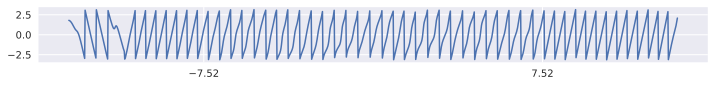

In [69]:
# wg_field
wg_field_data = sim.get_dft_array(wg_dft, mp.Ez, 0)
[x, y, z, w] = sim.get_array_metadata(dft_cell=wg_dft)
plt.figure(figsize=(12, 1))
plt.plot(x, np.angle(wg_field_data), linewidth=1.5)
plt.xticks([src_region.center.x, out_region.center.x])

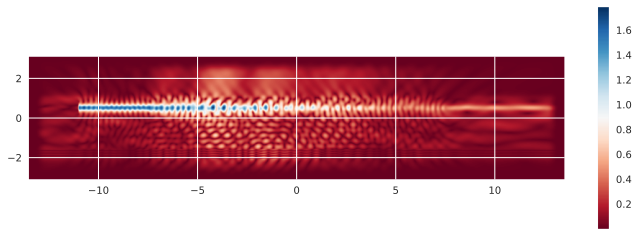

In [33]:
# wg_field

field_data = sim.get_dft_array(field_monitor, mp.Ez, 0)
field_eps = sim.get_array(
    component=mp.Permeability, center=mp.Vector3(), size=mp.Vector3(sx, sy)
)
[x, y, z, w] = sim.get_array_metadata(dft_cell=field_monitor)
x_grid, y_grid = np.meshgrid(x, y)
plt.figure(figsize=(12, 4))
# plt.pcolormesh(x_grid, y_grid, field_eps.transpose(), cmap="binary")
field_data = np.flipud(field_data.transpose())
# plt.imshow(np.angle(field_data[:][0:100])* np.abs(field_data[:][0:100]), cmap="RdBu")
# plot x and y axis
plt.imshow(np.abs(field_data[:]), cmap="RdBu", extent=[x[0], x[-1], y[0], y[-1]])
# plt.xticks([src_region.center.x, out_region.center.x])
# plt.yticks([0.5])
plt.colorbar()

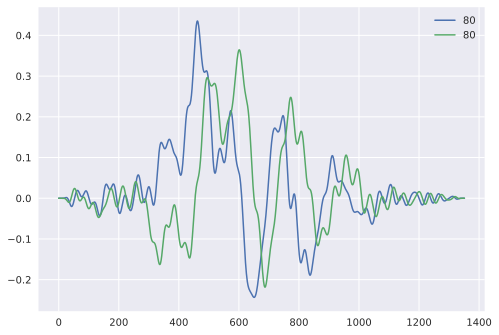

In [80]:
field_slices = []
for ii in [80]:
    # field_slices.append(field_data[ii, :])
    plt.plot(np.real(field_data[ii, :]), linewidth=1.5, label=f"{ii:.0f}")
    plt.plot(np.imag(field_data[ii, :]), linewidth=1.5, label=f"{ii:.0f}")
    # plt.plot(np.angle(field_data[ii, :]), linewidth=1.5, label=f"{ii:.0f}")
    plt.legend()

In [83]:
input_mode = sim.get_eigenmode_coefficients(
    src_field, [1], eig_parity=mp.EVEN_Y + mp.ODD_Z
)
input_mode_coe = np.squeeze(input_mode.alpha)
input_flux = mp.get_fluxes(src_field)
print(f"eigenmode_coe[0]计算得到的flux: {abs(input_mode_coe[0]) ** 2:.4f}")
print(f"flux计算得到的flux: {np.squeeze(input_flux):.4f}")
print(f'逆向eigenmode_coe[0]: {abs(input_mode_coe[1]) ** 2:.4f}')
print(f"正向eigenmode_coe[0]-逆向eigenmode_coe[1]: {abs(input_mode_coe[0]) ** 2 - abs(input_mode_coe[1]) ** 2:.4f}")

eigenmode_coe[0]计算得到的flux: 0.9594
flux计算得到的flux: 0.9635
逆向eigenmode_coe[0]: 0.0017
正向eigenmode_coe[0]-逆向eigenmode_coe[1]: 0.9578


In [84]:
output_mode = sim.get_eigenmode_coefficients(
    out_field, [1], eig_parity=mp.EVEN_Y + mp.ODD_Z
)
output_mode_coe = np.squeeze(output_mode.alpha)
output_flux = mp.get_fluxes(out_field)
print(f"flux计算得到的flux: {np.squeeze(output_flux):.4f}")
print(f"eigenmode_coe[0]计算得到的flux: {abs(output_mode_coe[0]) ** 2:.4f}")

flux计算得到的flux: 0.1012
eigenmode_coe[0]计算得到的flux: 0.0985


## Back propagation

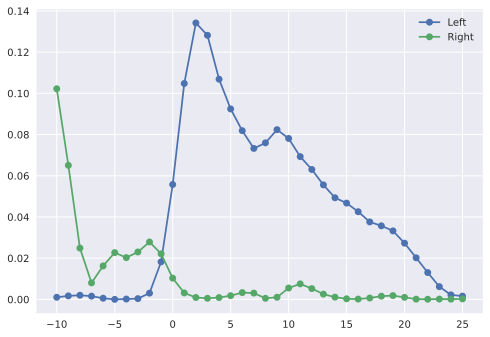

In [6]:
# import simulation results from file 'base_simulation_Gs_back.py'
back_path = cur_path + "/back/"
port_left_fluxes = np.load(back_path + "port_left_fluxes.npy")
port_right_fluxes = np.load(back_path + "port_right_fluxes.npy")
angles = np.load(back_path + "angles.npy")
plt.plot(angles, np.abs(port_left_fluxes), "-o", label="Left")
plt.plot(angles, np.abs(port_right_fluxes), "-o", label="Right")
plt.legend()